# Transaction Anomaly Identification

### Import Libraries

In [14]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from pycaret.anomaly import *

### Import data and Subset relevant data

In [25]:
df = pd.read_csv("input/trx_data.csv", delimiter="|")
df.head(100)  

#Select Relevant and Generic Value
df=df[['ACC_IDENTIFICATION', 'TRX_DATE', 'TRX_TIME','ISSUER', 'ACQUIRER', 'AMOUNT', 'BIT43']]
df

,ACC_IDENTIFICATION,TRX_DATE,TRX_TIME,ISSUER,ACQUIRER,AMOUNT,BIT43
0,936009152903140791,220620.0,232742.0,DNA,TMO,20000.0,GCR AUTO GENUINE PARTS KOTA JAKARTA ID
1,936009152479077716,220620.0,232740.0,DNA,YUK,50000.0,SEMUA VOUCHER (Pasar SeneJAKARTA PUSATID
2,9360091282215605047,220620.0,232747.0,OVO,TMO,32000.0,ONLINE99 KOTA JAKARTA ID
3,9360001412104589119,220620.0,232726.0,BCA,YUK,250000.0,SEMUA VOUCHER (Pasar SeneJAKARTA PUSATID
4,936009152482669566,220620.0,232736.0,DNA,BMS,50390.0,VOGAME JAKARTA BARATID
...,...,...,...,...,...,...,...
698982,936009150416507183,220623.0,232714.0,DNA,NET,45315.0,DEPOSIT REQUEST BOGOR ID
698983,9360049410169183145,220623.0,232739.0,BRY,BRI,1.0,QRIS DAHLIA MARPUAH BEKASI ID
698984,9360001412127634686,220623.0,232743.0,BCA,BRI,20000.0,COTTA COFFE BEKASI ID
698985,936009151932354076,220623.0,232645.0,DNA,BMS,38297.0,VOGAME JAKARTA BARATID


### Data Wrangling

In [16]:
#Wrangling

#Filter ACC Identification not null
df=df[df['ACC_IDENTIFICATION'].notnull()]
df=df[df['TRX_DATE'].notnull()]
df=df[df['TRX_TIME'].notnull()]

#Substring Merchant Location
df['BIT43']=df['BIT43'].str[25:]
df['BIT43']=df['BIT43'].str.strip()

#convert data type
df['TRX_DATE'] = df['TRX_DATE'].astype(str)
df['TRX_DATE']=df['TRX_DATE'].str[0:6]
df['TRX_TIME'] = df['TRX_TIME'].astype(str)
df['TRX_TIME']=df['TRX_TIME'].str[0:6]

#convert to datetime
df['TRX_DATETIME']=pd.to_datetime(df['TRX_DATE']+df['TRX_TIME'], format='%y%m%d%H%M%S',errors='coerce')

df['TIME_GAP'] = df.sort_values(['ACC_IDENTIFICATION','TRX_DATETIME']).groupby('ACC_IDENTIFICATION')['TRX_DATETIME'].diff().dt.total_seconds()
df=df[df['TIME_GAP'].notnull()]

#filter 1 date only to preserve memory
df=df[df['TRX_DATE']=='220622']

### Exploratory Data Analysis

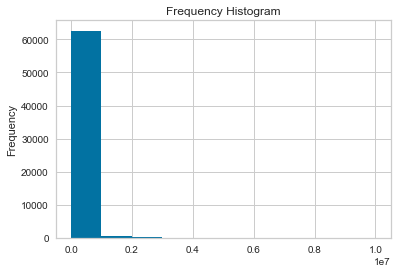

In [17]:
#EDA

plt.hist(df['AMOUNT'])
plt.gca().set(title='Frequency Histogram', ylabel='Frequency');

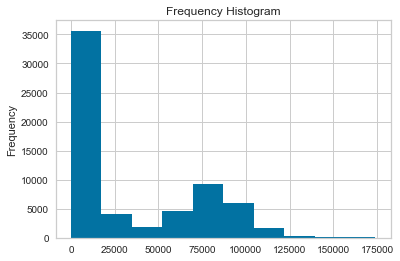

In [18]:
plt.hist(df['TIME_GAP'])
plt.gca().set(title='Frequency Histogram', ylabel='Frequency');

In [19]:
#write to file
df.to_csv("output/wrangling_result.csv", encoding='utf-8')

### Scaling Data

In [20]:
#Scaling data
sc = StandardScaler()
df[['AMOUNT', 'TIME_GAP']] = sc.fit_transform(df[['AMOUNT', 'TIME_GAP']])
df

,ACC_IDENTIFICATION,TRX_DATE,TRX_TIME,ISSUER,ACQUIRER,AMOUNT,BIT43,TRX_DATETIME,TIME_GAP
265736,9360012910202140886,220622,102047,DBA,BRI,-0.285851,TABANAN ID,2022-06-22 10:20:47,0.836623
271431,9360000812097412388,220622,100005,MDR,GPA,-0.032564,Wil. Kota JakID,2022-06-22 10:00:05,1.106721
271436,936009151734612085,220622,100001,DNA,BMS,-0.239087,JAKARTA SELATID,2022-06-22 10:00:01,0.573704
271437,9360091400007089176,220622,100005,GPY,PYD,-0.170220,JOMBANG ID,2022-06-22 10:00:05,0.478669
271442,9360000812050510202,220622,100009,MDR,SAT,-0.021551,Makassar ID,2022-06-22 10:00:09,0.910717
...,...,...,...,...,...,...,...,...,...
461362,9360000812109850161,220622,235956,MDR,SAT,-0.170220,Jakarta TimurID,2022-06-22 23:59:56,-0.866172
461363,9360000812114425744,220622,235957,MDR,SAT,-0.280345,Tangerang ID,2022-06-22 23:59:57,-0.865990
461367,936009152110700056,220622,235949,DNA,BMS,-0.169146,JAKARTA BARATID,2022-06-22 23:59:49,-0.862777
461370,936009150860923886,220622,235937,DNA,NET,-0.169256,BOGOR ID,2022-06-22 23:59:37,1.450240


### Setup ML Environment

In [21]:
#Setup initial data assesment
sample=df[['AMOUNT', 'TIME_GAP']]

anom = setup(data = sample,session_id = 123,preprocess=False)

,Description,Value
0,Session id,123
1,Original data shape,"(63533, 2)"
2,Transformed data shape,"(63533, 2)"
3,Numeric features,2


In [22]:
#Check available models with current sample data
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [23]:
#Build Model
iforest = create_model(model = 'iforest', fraction = 0.2)
plot_model(iforest, plot = 'tsne')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

### Save Labelled Output

In [24]:
#Save labelled prediction
results = assign_model(iforest)
results[['ACC_IDENTIFICATION', 'BIT43','TRX_DATETIME','ISSUER','ACQUIRER']]=df[['ACC_IDENTIFICATION', 'BIT43','TRX_DATETIME','ISSUER','ACQUIRER']]
results.to_csv("output/anomaly_score_new.csv", encoding='utf-8')
results

,AMOUNT,TIME_GAP,Anomaly,Anomaly_Score,ACC_IDENTIFICATION,BIT43,TRX_DATETIME,ISSUER,ACQUIRER
265736,-0.285851,0.836623,0,-0.007437,9360012910202140886,TABANAN ID,2022-06-22 10:20:47,DBA,BRI
271431,-0.032564,1.106721,0,-0.021311,9360000812097412388,Wil. Kota JakID,2022-06-22 10:00:05,MDR,GPA
271436,-0.239087,0.573704,0,-0.022258,936009151734612085,JAKARTA SELATID,2022-06-22 10:00:01,DNA,BMS
271437,-0.170220,0.478669,0,-0.011729,9360091400007089176,JOMBANG ID,2022-06-22 10:00:05,GPY,PYD
271442,-0.021551,0.910717,0,-0.001885,9360000812050510202,Makassar ID,2022-06-22 10:00:09,MDR,SAT
...,...,...,...,...,...,...,...,...,...
461362,-0.170220,-0.866172,0,-0.098233,9360000812109850161,Jakarta TimurID,2022-06-22 23:59:56,MDR,SAT
461363,-0.280345,-0.865990,0,-0.095953,9360000812114425744,Tangerang ID,2022-06-22 23:59:57,MDR,SAT
461367,-0.169146,-0.862777,0,-0.092094,936009152110700056,JAKARTA BARATID,2022-06-22 23:59:49,DNA,BMS
461370,-0.169256,1.450240,0,-0.049297,936009150860923886,BOGOR ID,2022-06-22 23:59:37,DNA,NET
